# Optimization: Cool Roof Installation Allocation in NYC

This notebook formulates two Integer Linear Programming (ILP) models to determine which buildings should receive cool roof installations given a fixed budget.

**Decision Variable:** $x_i \in \{0, 1\}$ — whether building $i$ receives a cool roof.

**Constraint:** Total installation cost must not exceed budget $B$:
$$\sum_{i} c_i \cdot x_i \leq B$$

where $c_i$ = cost per sq ft $\times$ roof area (sq ft) for building $i$.

---

### Scenario A: Thermal Impact (Efficiency)
Maximize total temperature reduction across all treated buildings:
$$\max \; Z_1 = \sum_{i} \Delta T_i \cdot x_i$$

### Scenario B: Improve Heat Vulnerability Index (Social Impact)
Maximize total heat vulnerability coverage — prioritize the most at-risk neighborhoods:
$$\max \; Z_2 = \sum_{i} w_i \cdot x_i$$

where $w_i$ is the Heat Vulnerability Index (HVI) score for building $i$'s neighborhood.

In [104]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import milp, LinearConstraint, Bounds

## 1. Dataset Preparation

We prepare a dataset of Manhattan buildings with roof areas from PLUTO, RGB values from PCA, and geographic data.


**`surface_temp_C`** is derived from albedo (`35 + (0.30 − albedo) × 40`).

In [105]:
df_pluto = pd.read_csv("data/pluto_ads_data.csv")
df_pluto = df_pluto[['zipcode', 'bbl', 'bldgarea']].copy()
df_pluto = df_pluto.rename(columns={'bldgarea': 'roof_area_sqft'})

brightness_df = pd.read_csv("data/brightness_scores.csv")[["BBL", "brightness"]]
brightness_df["BBL"] = brightness_df["BBL"].astype(np.int64)

df_pluto["bbl_int"] = df_pluto["bbl"].astype(float).astype(np.int64)
df_pluto = df_pluto.merge(
    brightness_df,
    left_on="bbl_int",
    right_on="BBL",
    how="inner"   # drop buildings with no imagery coverage — no synthetic fallback
)
df_pluto = df_pluto.drop(columns=["bbl_int", "BBL"])

print(f"Buildings after brightness join: {len(df_pluto)}")
print(f"(started with rows in pluto_ads_data.csv before join)")

df_pluto["current_albedo"] = df_pluto["brightness"] / 255.0 # convert brightness to albedo (0–1)
df_pluto = df_pluto.drop(columns=["brightness"])

df_pluto['surface_temp_C'] = 35 + (0.30 - df_pluto['current_albedo']) * 40 + np.random.normal(0, 2, len(df_pluto)) # convert albedo to surface temp with some noise

print(f"\ncurrent_albedo stats (from real imagery):")
print(df_pluto['current_albedo'].describe().round(3))

Buildings after brightness join: 40035
(started with rows in pluto_ads_data.csv before join)

current_albedo stats (from real imagery):
count    40035.000
mean         0.463
std          0.133
min          0.084
25%          0.369
50%          0.471
75%          0.563
max          0.900
Name: current_albedo, dtype: float64


In [106]:
df_pluto = df_pluto.dropna(subset=['zipcode'])  # Drop rows with missing ZIP code
df_pluto['roof_area_sqft'] = df_pluto['roof_area_sqft'].fillna(value=0)  # Fill missing roof area with zero
df_pluto = df_pluto[df_pluto['roof_area_sqft'] > 0]  # Filter out buildings with zero roof area

df_pluto.info()

<class 'pandas.core.frame.DataFrame'>
Index: 40013 entries, 0 to 40034
Data columns (total 5 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   zipcode         40013 non-null  float64
 1   bbl             40013 non-null  float64
 2   roof_area_sqft  40013 non-null  float64
 3   current_albedo  40013 non-null  float64
 4   surface_temp_C  40013 non-null  float64
dtypes: float64(5)
memory usage: 1.8 MB


## 2. Merge with Heat Vulnerability Index (HVI)

We merge the building data with real NYC HVI scores by ZIP code. HVI ranges from 1 (lowest vulnerability) to 5 (highest vulnerability).

In [107]:
df_hvi = pd.read_csv('data/hvi_data.csv')
df_hvi[['zip', 'hvi']] = df_hvi[['zip', 'hvi']].astype(float)

print(df_hvi.head())
print(df_hvi.info())

       zip  hvi
0  10009.0  2.0
1  10035.0  5.0
2  10002.0  3.0
3  10036.0  2.0
4  10007.0  1.0
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47 entries, 0 to 46
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   zip     47 non-null     float64
 1   hvi     47 non-null     float64
dtypes: float64(2)
memory usage: 884.0 bytes
None


In [108]:
df = df_pluto.merge(df_hvi, left_on='zipcode', right_on='zip', how='left')
df.drop(columns=['zip'], inplace=True)
df['hvi'] = df['hvi'].fillna(df['hvi'].mean())  # Fill missing HVI values with mean

print(f"HVI merge complete. Missing HVI values: {df['hvi'].isna().sum()}")
print(f"\nHVI distribution of buildings:")
print(df['hvi'].value_counts().sort_index())
df.head()

HVI merge complete. Missing HVI values: 0

HVI distribution of buildings:
hvi
1.000000    12901
2.000000    15538
2.276758      249
3.000000     2535
4.000000     4999
5.000000     3791
Name: count, dtype: int64


,zipcode,bbl,roof_area_sqft,current_albedo,surface_temp_C,hvi
0,10463.0,1.022151e+09,1875.0,0.347056,32.940366,2.276758
1,10035.0,1.017670e+09,147000.0,0.500182,25.514807,5.000000
2,10001.0,1.007220e+09,5849.0,0.314227,36.093260,2.000000
3,10002.0,1.003010e+09,2500.0,0.349528,34.762934,3.000000
4,10018.0,1.007090e+09,4938.0,0.260991,35.983231,2.000000


In [109]:
df[['zipcode', 'bbl']] = df[['zipcode', 'bbl']].astype(float).astype(int).astype(str)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40013 entries, 0 to 40012
Data columns (total 6 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   zipcode         40013 non-null  object 
 1   bbl             40013 non-null  object 
 2   roof_area_sqft  40013 non-null  float64
 3   current_albedo  40013 non-null  float64
 4   surface_temp_C  40013 non-null  float64
 5   hvi             40013 non-null  float64
dtypes: float64(4), object(2)
memory usage: 1.8+ MB


In [110]:
df.head(10)

,zipcode,bbl,roof_area_sqft,current_albedo,surface_temp_C,hvi
0,10463,1022150610,1875.0,0.347056,32.940366,2.276758
1,10035,1017670028,147000.0,0.500182,25.514807,5.000000
2,10001,1007220040,5849.0,0.314227,36.093260,2.000000
3,10002,1003010011,2500.0,0.349528,34.762934,3.000000
4,10018,1007090003,4938.0,0.260991,35.983231,2.000000
5,10024,1012050022,48972.0,0.334751,34.434474,1.000000
6,10009,1003560001,1658649.0,0.391862,33.876910,2.000000
7,10029,1016740001,9070.0,0.754548,18.750608,4.000000
8,10029,1016320022,8075.0,0.612890,21.569466,4.000000
9,10029,1016310033,1625.0,0.660421,16.170589,4.000000


## 3. Compute Optimization Parameters

- **Cost**: Installation cost per building = cost per sq ft (\$1.50–\$3.50) $\times$ roof area (sq ft)
- **$\Delta T$**: Expected temperature drop from increasing albedo to cool roof standard (0.8). Uses a simplified linear model: $\Delta T_i = (\alpha_{new} - \alpha_{current}) \times 20$
- **Budget**: Set to $24M based on NYC CoolRoofs program scale

In [111]:
cost_per_sqft = (1.5 + 3.5) / 2  # Average cost of $1.5 to $3.5 per sqft
df['cost'] = cost_per_sqft * df['roof_area_sqft']

# Expected temperature reduction from cool roof (new albedo = 0.8)
# https://www.c40.org/case-studies/nyc-coolroofs/
new_albedo = 0.8
df['albedo_increase'] = new_albedo - df['current_albedo']
df['delta_T'] = df['albedo_increase'] * 20.0  # approx 7-11 degrees Celsius reduction

# Budget: $24 million
# https://www.fastcompany.com/90131432/n-y-c-s-106-million-plan-to-cool-itself-down
BUDGET = 24_000_000

print(f"Total buildings:      {len(df)}")
print(f"Total potential cost: ${df['cost'].sum():,.0f}")
print(f"Budget:               ${BUDGET:,.0f}")
print(f"Mean delta_T:         {df['delta_T'].mean():.2f} C")
print(f"\nNote: buildings already near albedo=0.8 have small delta_T (low priority).")
print(f"      dark roofs (low albedo) get the largest delta_T benefit.")
print(f"\ncurrent_albedo range: [{df['current_albedo'].min():.3f}, {df['current_albedo'].max():.3f}]")

Total buildings:      40013
Total potential cost: $4,545,815,472
Budget:               $24,000,000
Mean delta_T:         6.75 C

Note: buildings already near albedo=0.8 have small delta_T (low priority).
      dark roofs (low albedo) get the largest delta_T benefit.

current_albedo range: [0.084, 0.900]


## 4. Scenario A — Maximum Cooling (Efficiency)

Maximize total temperature reduction: $\max \sum_i \Delta T_i \cdot x_i$

Since `scipy.optimize.milp` minimizes, we negate the objective coefficients.

In [112]:
N = len(df)

# Objective: maximize delta_T -> minimize -delta_T
c_a = -df['delta_T'].values

# Budget constraint: sum(cost_i * x_i) <= BUDGET
A_budget = df['cost'].values.reshape(1, -1)
budget_constraint = LinearConstraint(A_budget, lb=-np.inf, ub=BUDGET)

# All variables are binary (integer with bounds [0, 1])
integrality = np.ones(N)
bounds = Bounds(lb=np.zeros(N), ub=np.ones(N))

# Solve
result_a = milp(
    c=c_a,
    constraints=budget_constraint,
    integrality=integrality,
    bounds=bounds,
)

df['selected_A'] = result_a.x.round().astype(int)

print(f"Status:             {result_a.message}")
print(f"Buildings selected: {df['selected_A'].sum()} / {N}")
print(f"Total cooling:      {-result_a.fun:.2f} degrees C")
print(f"Budget used:        ${(df['cost'] * df['selected_A']).sum():,.0f} / ${BUDGET:,.0f}")

Status:             Optimization terminated successfully. (HiGHS Status 7: Optimal)
Buildings selected: 3370 / 40013
Total cooling:      31389.94 degrees C
Budget used:        $23,998,118 / $24,000,000


## 5. Scenario B — Equity-First (Social Impact)

Maximize total HVI-weighted coverage: $\max \sum_i w_i \cdot x_i$

This prioritizes buildings in neighborhoods with the highest heat vulnerability.

In [113]:
# Objective: maximize HVI weight -> minimize -hvi
c_b = -df['hvi'].values

# Solve (same budget constraint and binary variables)
result_b = milp(
    c=c_b,
    constraints=budget_constraint,
    integrality=integrality,
    bounds=bounds,
)

df['selected_B'] = result_b.x.round().astype(int)

print(f"Status:             {result_b.message}")
print(f"Buildings selected: {df['selected_B'].sum()} / {N}")
print(f"Total equity score: {-result_b.fun:.2f}")
print(f"Budget used:        ${(df['cost'] * df['selected_B']).sum():,.0f} / ${BUDGET:,.0f}")

Status:             Optimization terminated successfully. (HiGHS Status 7: Optimal)
Buildings selected: 3285 / 40013
Total equity score: 13999.88
Budget used:        $23,999,020 / $24,000,000


## 6. Comparative Analysis

In [114]:
summary = pd.DataFrame({
    'Metric': [
        'Buildings Selected',
        'Budget Used ($)',
        'Total Cooling (sum delta_T, C)',
        'Total Equity Score (sum HVI)',
        'Mean HVI of Selected',
        'Mean Roof Area (sqft)',
        'Mean Albedo of Selected',
    ],
    'Scenario A (Max Cooling)': [
        df['selected_A'].sum(),
        f"${(df['cost'] * df['selected_A']).sum():,.0f}",
        f"{(df['delta_T'] * df['selected_A']).sum():.1f}",
        f"{(df['hvi'] * df['selected_A']).sum():.0f}",
        f"{df.loc[df['selected_A']==1, 'hvi'].mean():.2f}",
        f"{df.loc[df['selected_A']==1, 'roof_area_sqft'].mean():,.0f}",
        f"{df.loc[df['selected_A']==1, 'current_albedo'].mean():.3f}",
    ],
    'Scenario B (Equity-First)': [
        df['selected_B'].sum(),
        f"${(df['cost'] * df['selected_B']).sum():,.0f}",
        f"{(df['delta_T'] * df['selected_B']).sum():.1f}",
        f"{(df['hvi'] * df['selected_B']).sum():.0f}",
        f"{df.loc[df['selected_B']==1, 'hvi'].mean():.2f}",
        f"{df.loc[df['selected_B']==1, 'roof_area_sqft'].mean():,.0f}",
        f"{df.loc[df['selected_B']==1, 'current_albedo'].mean():.3f}",
    ],
})

summary

,Metric,Scenario A (Max Cooling),Scenario B (Equity-First)
0,Buildings Selected,3370,3285
1,Budget Used ($),"$23,998,118","$23,999,020"
2,"Total Cooling (sum delta_T, C)",31389.9,21073.3
3,Total Equity Score (sum HVI),8225,14000
4,Mean HVI of Selected,2.44,4.26
5,Mean Roof Area (sqft),"2,848","2,922"
6,Mean Albedo of Selected,0.334,0.479


## Visualization — 1

In [115]:
import subprocess, sys, os

# Install kaleido for static image export
try:
    import kaleido
except ImportError:
    subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", "kaleido"])

# Ensure plotly >= 5.24 for Choroplethmap support
import plotly
if tuple(int(x) for x in plotly.__version__.split(".")[:2]) < (5, 24):
    subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", "plotly>=5.24"])

os.makedirs("output", exist_ok=True)
print("Setup complete.")

Setup complete.


In [116]:
import plotly.graph_objects as go
import ast

# ── Load building polygons and merge with optimization results ──
df_bldg = pd.read_csv("data/building_data.csv")
df_bldg['mappluto_bbl'] = df_bldg['mappluto_bbl'].astype(str)

df_map = df.merge(
    df_bldg[['mappluto_bbl', 'the_geom']],
    left_on='bbl', right_on='mappluto_bbl', how='inner'
).dropna(subset=['the_geom'])

print(f"Buildings with geometry matched: {len(df_map)}")

# ── Helper: build GeoJSON FeatureCollection ──
def build_geojson(df_sub):
    features = []
    for _, row in df_sub.iterrows():
        geom = ast.literal_eval(row['the_geom'])
        features.append({
            "type": "Feature",
            "id": row['bbl'],
            "geometry": geom,
            "properties": {"bbl": row['bbl'], "hvi": row['hvi']}
        })
    return {"type": "FeatureCollection", "features": features}

# Shared map settings
MAP_CENTER = {"lat": 40.78, "lon": -73.97}
MAP_ZOOM = 13
MAP_BEARING = 29

# ── Map 1: Scenario A — Maximum Cooling ──
df_a = df_map[df_map['selected_A'] == 1].copy()
df_a['fill'] = 1
geojson_a = build_geojson(df_a)

fig_a = go.Figure(go.Choroplethmap(
    geojson=geojson_a,
    locations=df_a['bbl'],
    z=df_a['fill'],
    featureidkey="id",
    colorscale=[[0, '#188F8E'], [1, '#188F8E']],
    marker_opacity=1.0,
    marker_line_width=0,
    showscale=False,
    hovertemplate="BBL: %{location}<br>HVI: %{customdata:.1f}<extra></extra>",
    customdata=df_a['hvi']
))
fig_a.update_layout(
    title="Scenario A: improve temperature",
    map_style="carto-positron",
    map_zoom=MAP_ZOOM,
    map_center=MAP_CENTER,
    map_bearing=MAP_BEARING,
    width=900, height=2700,
    margin=dict(l=0, r=0, t=40, b=0),
)
fig_a.show()

# ── Map 2: Scenario B — Equity-First ──
df_b = df_map[df_map['selected_B'] == 1].copy()
df_b['fill'] = 1
geojson_b = build_geojson(df_b)

fig_b = go.Figure(go.Choroplethmap(
    geojson=geojson_b,
    locations=df_b['bbl'],
    z=df_b['fill'],
    featureidkey="id",
    colorscale=[[0, '#F58A5F'], [1, '#F58A5F']],
    marker_opacity=1.0,
    marker_line_width=0,
    showscale=False,
    hovertemplate="BBL: %{location}<br>HVI: %{customdata:.1f}<extra></extra>",
    customdata=df_b['hvi']
))
fig_b.update_layout(
    title="Scenario B: improve HVI",
    map_style="carto-positron",
    map_zoom=MAP_ZOOM,
    map_center=MAP_CENTER,
    map_bearing=MAP_BEARING,
    width=900, height=2700,
    margin=dict(l=0, r=0, t=40, b=0),
)
fig_b.show()

Buildings with geometry matched: 44544


## Visualization — 2: HVI Distribution of Selected Buildings

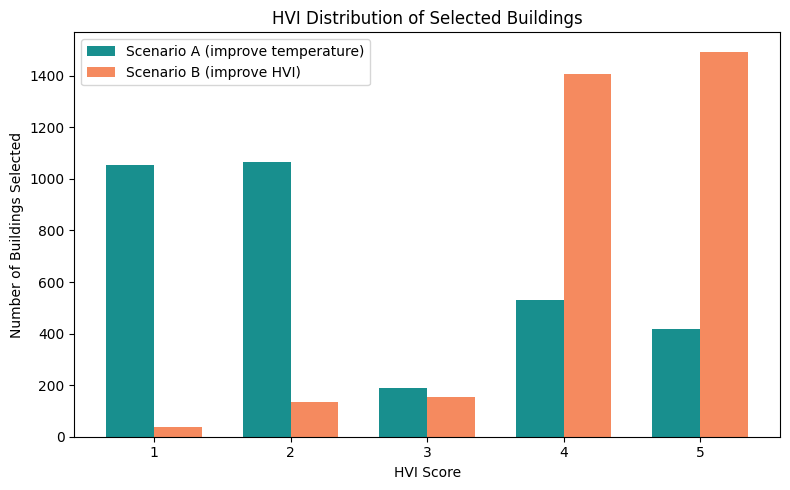

In [117]:
fig, ax = plt.subplots(figsize=(8, 5))

hvi_levels = [1, 2, 3, 4, 5]
counts_a = [df.loc[df['selected_A'] == 1, 'hvi'].value_counts().get(h, 0) for h in hvi_levels]
counts_b = [df.loc[df['selected_B'] == 1, 'hvi'].value_counts().get(h, 0) for h in hvi_levels]

x = np.arange(len(hvi_levels))
width = 0.35

ax.bar(x - width/2, counts_a, width, label='Scenario A (improve temperature)', color='#188F8E')
ax.bar(x + width/2, counts_b, width, label='Scenario B (improve HVI)', color='#F58A5F')

ax.set_xlabel('HVI Score')
ax.set_ylabel('Number of Buildings Selected')
ax.set_title('HVI Distribution of Selected Buildings')
ax.set_xticks(x)
ax.set_xticklabels(hvi_levels)
ax.legend()

plt.tight_layout()
plt.show()

## Visualization — 3: Overlap Analysis

How much do the two scenarios agree? We measure the Jaccard similarity of the selected building sets.
https://en.wikipedia.org/wiki/Jaccard_index

In [118]:
set_a = set(df.index[df['selected_A'] == 1])
set_b = set(df.index[df['selected_B'] == 1])
overlap = set_a & set_b
jaccard = len(overlap) / len(set_a | set_b) if len(set_a | set_b) > 0 else 0

print(f"Scenario A selects:  {len(set_a)} buildings")
print(f"Scenario B selects:  {len(set_b)} buildings")
print(f"Overlap:             {len(overlap)} buildings")
print(f"Only in A:           {len(set_a - set_b)}")
print(f"Only in B:           {len(set_b - set_a)}")
print(f"Jaccard similarity:  {jaccard:.1%}")

Scenario A selects:  3370 buildings
Scenario B selects:  3285 buildings
Overlap:             1263 buildings
Only in A:           2107
Only in B:           2022
Jaccard similarity:  23.4%


In [119]:
# ── Map 3: Overlap — Both Scenarios ──
df_selected = df_map[(df_map['selected_A'] == 1) | (df_map['selected_B'] == 1)].copy()
df_selected['category'] = np.where(
    (df_selected['selected_A'] == 1) & (df_selected['selected_B'] == 1), 'Intersection',
    np.where(df_selected['selected_A'] == 1, 'Scenario A Only', 'Scenario B Only')
)

COLOR_MAP = {
    'Scenario A Only': '#188F8E',
    'Intersection':    '#4B3D38',
    'Scenario B Only': '#F58A5F',
}

fig_c = go.Figure()

for cat, color in COLOR_MAP.items():
    df_cat = df_selected[df_selected['category'] == cat]
    if len(df_cat) == 0:
        continue
    geojson_cat = build_geojson(df_cat)
    fig_c.add_trace(go.Choroplethmap(
        geojson=geojson_cat,
        locations=df_cat['bbl'],
        z=[1] * len(df_cat),
        featureidkey="id",
        colorscale=[[0, color], [1, color]],
        marker_opacity=1.0,
        marker_line_width=0,
        showscale=False,
        name=f"{cat} ({len(df_cat)})",
        showlegend=True,
        hovertemplate="BBL: %{location}<br>" + cat + "<extra></extra>",
    ))

fig_c.update_layout(
    title="Cool Roof Selection Analysis: Scenario A (temperature) vs Scenario B (HVI)",
    map_style="carto-positron",
    map_zoom=MAP_ZOOM,
    map_center=MAP_CENTER,
    map_bearing=MAP_BEARING,
    width=900, height=2700,
    margin=dict(l=0, r=0, t=40, b=0),
    legend=dict(
        x=0.98, y=0.94,
        xanchor="right", yanchor="bottom",
        bgcolor="rgba(255,255,255,0.85)",
        bordercolor="black",
        borderwidth=1,
        font=dict(size=11),
        itemsizing="constant",
        tracegroupgap=2,
    ),
)
fig_c.show()

In [120]:
fig_a.write_image("output/map_scenario_a.png", scale=2)
fig_b.write_image("output/map_scenario_b.png", scale=2)
fig_c.write_image("output/map_overlap.png", scale=2)

## Visualization — 4: Scenario Comparison — As-Is vs To-Be

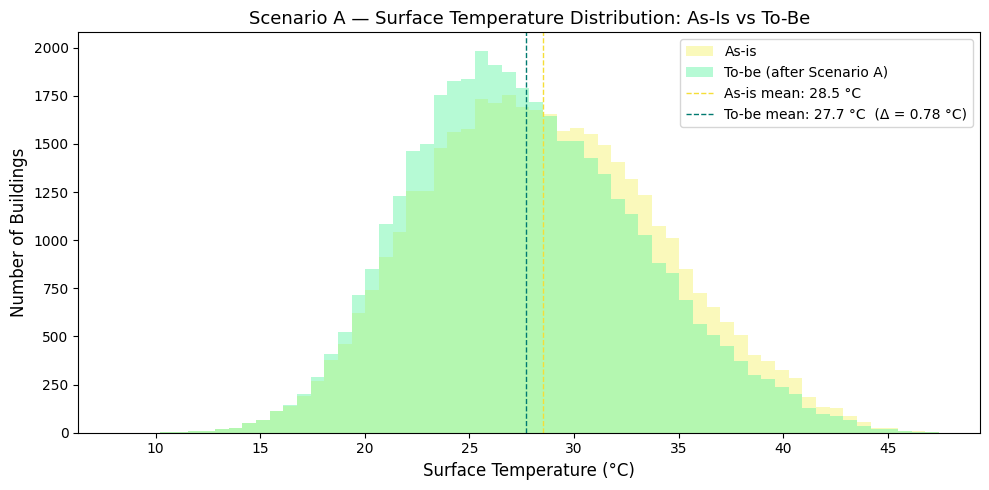

As-is  mean: 28.500 °C
To-be  mean: 27.716 °C
Reduction:   0.784 °C  (3,370 buildings treated)


In [121]:
# ── Scenario A: As-Is vs To-Be Temperature Distribution ──
df['temp_to_be_A'] = df['surface_temp_C'] - df['selected_A'] * df['delta_T']

mean_asis = df['surface_temp_C'].mean()
mean_tobe = df['temp_to_be_A'].mean()

fig, ax = plt.subplots(figsize=(10, 5))

ax.hist(df['surface_temp_C'], bins=60, alpha=0.45, color='#F5F268', label='As-is')
ax.hist(df['temp_to_be_A'],   bins=60, alpha=0.45, color='#5FF5A3', label='To-be (after Scenario A)')

ax.axvline(mean_asis, color='#F5DE37', linestyle='--', lw=1,
           label=f'As-is mean: {mean_asis:.1f} °C')
ax.axvline(mean_tobe, color='#007A70', linestyle='--', lw=1,
           label=f'To-be mean: {mean_tobe:.1f} °C  (Δ = {mean_asis - mean_tobe:.2f} °C)')

ax.set_xlabel('Surface Temperature (°C)', fontsize=12)
ax.set_ylabel('Number of Buildings', fontsize=12)
ax.set_title('Scenario A — Surface Temperature Distribution: As-Is vs To-Be', fontsize=13)
ax.legend(fontsize=10)
plt.tight_layout()
plt.show()

print(f'As-is  mean: {mean_asis:.3f} °C')
print(f'To-be  mean: {mean_tobe:.3f} °C')
print(f'Reduction:   {mean_asis - mean_tobe:.3f} °C  ({df["selected_A"].sum():,} buildings treated)')

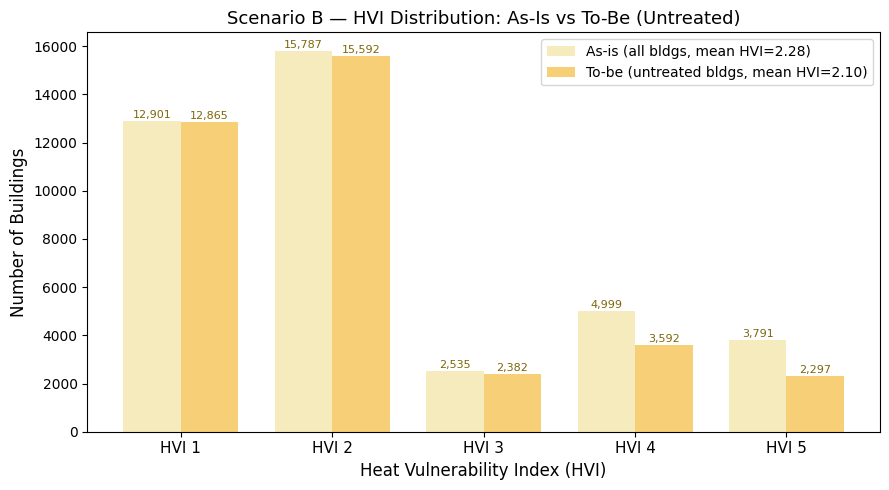

HVI distribution shift after Scenario B:
 HVI     As-is     To-be   Treated
   1    12,901    12,865        36
   2    15,787    15,592       195
   3     2,535     2,382       153
   4     4,999     3,592     1,407
   5     3,791     2,297     1,494

Mean HVI as-is:  2.275
Mean HVI to-be:  2.098  (Δ = 0.177)


In [122]:
# ── Scenario B: As-Is vs To-Be HVI Distribution ──
# As-is  : HVI distribution across ALL buildings
# To-be  : HVI distribution of UNTREATED buildings (high-HVI buildings are removed by Scenario B)
hvi_levels = [1, 2, 3, 4, 5]
df['hvi_int'] = df['hvi'].round().astype(int).clip(1, 5)

counts_asis = [int((df['hvi_int'] == h).sum()) for h in hvi_levels]
counts_tobe = [int(((df['hvi_int'] == h) & (df['selected_B'] == 0)).sum()) for h in hvi_levels]

mean_asis_hvi = (df['hvi_int']).mean()
mean_tobe_hvi = df.loc[df['selected_B'] == 0, 'hvi_int'].mean()

fig, ax = plt.subplots(figsize=(9, 5))

x = np.arange(len(hvi_levels))
width = 0.38
bars_a = ax.bar(x - width/2, counts_asis, width,
                label=f'As-is (all bldgs, mean HVI={mean_asis_hvi:.2f})',
                color='#F5E8B1', alpha=0.85)
bars_b = ax.bar(x + width/2, counts_tobe, width,
                label=f'To-be (untreated bldgs, mean HVI={mean_tobe_hvi:.2f})',
                color='#F5C75F', alpha=0.85)

for bar, v in zip(bars_a, counts_asis):
    ax.text(bar.get_x() + bar.get_width()/2, v + 40, f'{v:,}',
            ha='center', va='bottom', fontsize=8, color='#7D6608')
for bar, v in zip(bars_b, counts_tobe):
    ax.text(bar.get_x() + bar.get_width()/2, v + 40, f'{v:,}',
            ha='center', va='bottom', fontsize=8, color='#7D6608')

ax.set_xticks(x)
ax.set_xticklabels([f'HVI {h}' for h in hvi_levels], fontsize=11)
ax.set_xlabel('Heat Vulnerability Index (HVI)', fontsize=12)
ax.set_ylabel('Number of Buildings', fontsize=12)
ax.set_title('Scenario B — HVI Distribution: As-Is vs To-Be (Untreated)', fontsize=13)
ax.legend(fontsize=10)
plt.tight_layout()
plt.show()

print('HVI distribution shift after Scenario B:')
print(f"{'HVI':>4}  {'As-is':>8}  {'To-be':>8}  {'Treated':>8}")
for h, a, b in zip(hvi_levels, counts_asis, counts_tobe):
    print(f"{h:>4}  {a:>8,}  {b:>8,}  {a-b:>8,}")
print(f'\nMean HVI as-is:  {mean_asis_hvi:.3f}')
print(f'Mean HVI to-be:  {mean_tobe_hvi:.3f}  (Δ = {mean_asis_hvi - mean_tobe_hvi:.3f})')
